# Additive Velocity Disentanglement Analysis

This notebook expands the additive-flow analysis to cover reconstruction quality, temporal rollout behavior, age/disease/residual velocity components, counterfactual diagnosis control, speed curves, leakage probes, and comparisons against both the adversarial additive variant and the baseline longitudinal model.


In [1]:
import json
import math
import random
import re
import sys
from pathlib import Path

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import torch
import trimesh
from IPython.display import display
from scipy.spatial import cKDTree
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, r2_score, roc_auc_score

ROOT = Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import deep_sdf
import deep_sdf.mesh
from train_deep_sdf_longitudinal_additive_flow import (
    _apply_temporal_flow_interval,
    apply_temporal_flow,
    optimize_subject_anchor_from_observations,
)
from networks.longitudinal_additive_flow import build_temporal_flow

EXP_DIR = ROOT / 'examples' / 'Torus_subset_100_id_age_progression' / 'longitudinal_age_disease_additive_velocity_disentanglement'
ADV_EXP_DIR = ROOT / 'examples' / 'Torus_subset_100_id_age_progression' / 'longitudinal_age_disease_additive_velocity_disentanglement_adversarial'
BASELINE_EXP_DIR = ROOT / 'examples' / 'Torus_subset_100_id_age_progression' / 'longitudinal_age_disease_conditioned_cocycle_shape'
OUT_DIR = EXP_DIR / 'analysis_additive_velocity_disentanglement'
FIG_DIR = OUT_DIR / 'figures'

SPECS = json.loads((EXP_DIR / 'specs.json').read_text())
ADV_SPECS = json.loads((ADV_EXP_DIR / 'specs.json').read_text())
BASELINE_SPECS = json.loads((BASELINE_EXP_DIR / 'specs.json').read_text())

CHECKPOINT = 'latest.pth'
ADV_CHECKPOINT = 'latest.pth'
BASELINE_CHECKPOINT = 'latest.pth'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
SEED = 7
GRID_RES_VIS = 64
GRID_RES_ANALYSIS = 96
SAMPLES_CHAMFER = 5000
COMPOSED_MAX_DT_VIS = 0.12
COMPOSED_MAX_DT_ANALYSIS = 0.08
MAX_TRAIN_SUBJECTS_FOR_PROBES = 48
MAX_TEST_SUBJECTS_FOR_PROBES = 12
FIGURE_DPI = 180

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

print('Device:', DEVICE)
print('Experiment:', EXP_DIR)
print('Adversarial additive:', ADV_EXP_DIR)
print('Baseline experiment:', BASELINE_EXP_DIR)


Device: cuda
Experiment: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement
Adversarial additive: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement_adversarial
Baseline experiment: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_conditioned_cocycle_shape


In [2]:
# ---- Labels + splits ----

def _resolve_path(path_value, exp_dir=EXP_DIR):
    p = Path(path_value)
    if p.is_absolute():
        return p
    return (exp_dir / p).resolve()


def load_labels_table(labels_path):
    labels_obj = torch.load(labels_path, map_location='cpu')
    rows = []
    for name, payload in labels_obj.items():
        row = {'scan_id': str(name)}
        if isinstance(payload, dict):
            for k, v in payload.items():
                if torch.is_tensor(v):
                    if v.numel() == 1:
                        row[k] = float(v.item())
                    else:
                        row[k] = v.detach().cpu().numpy().tolist()
                else:
                    row[k] = v
        rows.append(row)
    df = pd.DataFrame(rows)
    for c in ['diagnosis', 'time_index', 'tau_years', 'age', 'age_norm', 'thickness_t', 'bump_height', 'radius', 'thickness', 'bump_speed_gt']:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors='coerce')
    return df

TRAIN_SPLIT = json.loads(_resolve_path(SPECS['TrainSplit']).read_text())
TEST_SPLIT = json.loads(_resolve_path(SPECS['TestSplit']).read_text())
LABELS_PATH = _resolve_path(SPECS['AgeMetadataFile'])
LABELS_ROOT = LABELS_PATH.parent
SCALED_MESH_ROOT = LABELS_ROOT / 'scaled_obj_files'
LABEL_DF = load_labels_table(LABELS_PATH)

AGE_CONDITION_KEYS = list(SPECS.get('AgeConditionKeys', [SPECS.get('AgeConditionKey', 'diagnosis')]))
USE_AGE_CONDITIONING = bool(SPECS.get('UseAgeConditioning', False))
AGE_CONDITION_DIM = int(SPECS.get('AgeConditionDim', len(AGE_CONDITION_KEYS) if USE_AGE_CONDITIONING else 0))

age_slope = None
age_intercept = None
if 'age_norm' in LABEL_DF.columns and 'age' in LABEL_DF.columns:
    sub = LABEL_DF[['age', 'age_norm']].dropna()
    if len(sub) >= 2:
        coef = np.polyfit(sub['age'].to_numpy(), sub['age_norm'].to_numpy(), deg=1)
        age_slope = float(coef[0])
        age_intercept = float(coef[1])

print('train scans:', len(TRAIN_SPLIT), '| test scans:', len(TEST_SPLIT))
print('label rows:', len(LABEL_DF))
print('condition keys:', AGE_CONDITION_KEYS)
print('age_norm fit:', age_slope, age_intercept)


train scans: 400 | test scans: 75
label rows: 500
condition keys: ['diagnosis']
age_norm fit: 0.024999999999999988 -1.2499999999999991


In [3]:
# ---- Model, metadata, mesh, plotting helpers ----

SID_RE = re.compile(r'__sid-(\d+)__')
TP_RE = re.compile(r'__tp-(\d+)__')


def base_id(name):
    return Path(str(name)).stem


def parse_sid_tp(name):
    stem = base_id(name)
    m_sid = SID_RE.search(stem)
    m_tp = TP_RE.search(stem)
    sid = int(m_sid.group(1)) if m_sid else None
    tp = int(m_tp.group(1)) if m_tp else None
    return sid, tp


def load_decoder_and_flow(exp_dir, specs_obj, checkpoint='latest.pth'):
    arch = __import__('networks.' + specs_obj['NetworkArch'], fromlist=['Decoder'])
    latent_size = int(specs_obj['CodeLength'])
    decoder = arch.Decoder(latent_size, **specs_obj['NetworkSpecs']).to(DEVICE)
    flow = build_temporal_flow(
        specs_obj,
        latent_size,
        specs_obj.get('FlowHiddenDims', [256, 256]),
        age_condition_dim=int(specs_obj.get('AgeConditionDim', 0)),
    ).to(DEVICE)
    ckpt_path = exp_dir / 'ModelParameters' / checkpoint
    ckpt = torch.load(ckpt_path, map_location=DEVICE)
    decoder.load_state_dict(ckpt['model_state_dict'])
    flow_state = ckpt.get('temporal_flow_state_dict', ckpt.get('flow_state_dict'))
    if flow_state is None:
        raise RuntimeError(f'No flow state dict found in {ckpt_path}')
    flow.load_state_dict(flow_state)
    decoder.eval()
    flow.eval()
    epoch = ckpt.get('epoch', None)
    return decoder, flow, epoch, ckpt_path


def _checkpoint_path(exp_dir, subdir, checkpoint):
    ckpt_name = str(checkpoint)
    candidates = [exp_dir / subdir / ckpt_name]
    if not ckpt_name.endswith('.pth'):
        candidates.append(exp_dir / subdir / f'{ckpt_name}.pth')
    for cand in candidates:
        if cand.exists():
            return cand
    return candidates[0]


def _extract_latent_weights(payload):
    if not isinstance(payload, dict):
        return None
    if 'latent_codes_state_dict' in payload and 'weight' in payload['latent_codes_state_dict']:
        weights = payload['latent_codes_state_dict']['weight']
    elif 'latent_codes' in payload:
        lat = payload['latent_codes']
        weights = lat.get('weight') if isinstance(lat, dict) else lat
    else:
        return None
    if weights.dim() == 3 and weights.shape[1] == 1:
        weights = weights.squeeze(1)
    return weights.detach().cpu().float()


def load_train_subject_anchors(exp_dir, checkpoint='latest.pth'):
    searched = []
    for subdir in ('ModelParameters', 'LatentCodes'):
        ckpt_path = _checkpoint_path(exp_dir, subdir, checkpoint)
        searched.append(str(ckpt_path))
        if not ckpt_path.exists():
            continue
        weights = _extract_latent_weights(torch.load(ckpt_path, map_location='cpu'))
        if weights is not None:
            print('Loaded train anchors:', ckpt_path, tuple(weights.shape))
            return weights
    raise RuntimeError('Could not find latent code weights. Searched: ' + ', '.join(searched))


def scan_record_from_label_map(scan_name):
    stem = base_id(scan_name)
    row = LABEL_DF[LABEL_DF['scan_id'].astype(str) == stem]
    if len(row) == 0:
        sid, tp = parse_sid_tp(stem)
        if sid is not None and tp is not None and 'subject_index' in LABEL_DF.columns and 'time_index' in LABEL_DF.columns:
            row = LABEL_DF[(LABEL_DF['subject_index'] == sid) & (LABEL_DF['time_index'] == tp)]
    if len(row) == 0:
        raise KeyError(f'No label row found for scan {scan_name}')
    return row.iloc[0].to_dict()


def condition_vector_from_record(rec):
    if not USE_AGE_CONDITIONING:
        return None
    vals = []
    for key in AGE_CONDITION_KEYS:
        val = rec.get(key, None)
        if val is None or (isinstance(val, float) and math.isnan(val)):
            raise ValueError(f'Missing condition key={key} in record {rec.get("name", rec.get("scan_id", "?"))}')
        vals.append(float(val))
    return torch.tensor(vals, dtype=torch.float32)


def resolve_gt_mesh_path(mesh_path):
    if mesh_path is None:
        return None
    mesh_path = Path(mesh_path)
    candidates = []
    if mesh_path.is_absolute():
        if 'obj_files' in mesh_path.parts:
            parts = list(mesh_path.parts)
            obj_idx = parts.index('obj_files')
            parts[obj_idx] = 'scaled_obj_files'
            candidates.append(Path(*parts))
        candidates.append(mesh_path)
    else:
        if len(mesh_path.parts) >= 2 and mesh_path.parts[0] == 'obj_files':
            candidates.append((LABELS_ROOT / 'scaled_obj_files' / mesh_path.name).resolve())
        candidates.append((SCALED_MESH_ROOT / mesh_path.name).resolve())
        candidates.append((LABELS_ROOT / mesh_path).resolve())
    for cand in candidates:
        if cand.exists():
            return cand
    return candidates[0]


def build_split_meta(split_names, split_name='split'):
    records = []
    for scan_name in split_names:
        meta = scan_record_from_label_map(scan_name)
        sid = int(meta.get('subject_index', parse_sid_tp(scan_name)[0]))
        tp_user = int(meta.get('time_index', parse_sid_tp(scan_name)[1]))
        time_val = float(meta.get('age_norm', meta.get('tau_years', tp_user)))
        gt_path = resolve_gt_mesh_path(meta.get('mesh_path', None))
        cond = condition_vector_from_record(meta)
        rec = {
            'name': base_id(scan_name),
            'subject_id': sid,
            'tp_user': tp_user,
            'time': time_val,
            'age': float(meta.get('age', np.nan)),
            'age_norm': float(meta.get('age_norm', np.nan)),
            'diagnosis': int(meta.get('diagnosis', 0)),
            'bump_height': float(meta.get('bump_height', np.nan)) if 'bump_height' in meta else np.nan,
            'bump_speed_gt': float(meta.get('bump_speed_gt', np.nan)) if 'bump_speed_gt' in meta else np.nan,
            'gt_path': str(gt_path) if gt_path is not None else None,
            'cond': cond,
            'scan_id': base_id(scan_name),
            'raw': meta,
        }
        records.append(rec)
    subject_to_records = {}
    for rec in records:
        subject_to_records.setdefault(rec['subject_id'], []).append(rec)
    for sid in subject_to_records:
        subject_to_records[sid] = sorted(subject_to_records[sid], key=lambda x: x['time'])
    return {
        'records': records,
        'subject_to_records': subject_to_records,
        'subject_ids_sorted': sorted(subject_to_records.keys()),
        'global_min': float(min(r['time'] for r in records)),
        'global_max': float(max(r['time'] for r in records)),
        'split_name': split_name,
    }


def load_sdf_ram(npz_path):
    return deep_sdf.data.read_sdf_samples_into_ram(str(npz_path))


def observations_from_records(records, specs_obj, observed_count=1, num_samples=None):
    recs = records[:int(observed_count)]
    ds_root = Path(specs_obj['DataSource'])
    obs = []
    for rec in recs:
        npz_path = ds_root / (rec['scan_id'] + '.npz')
        item = {
            'name': rec['name'],
            'time': float(rec['time']),
            'samples': load_sdf_ram(npz_path),
            'age_cond': rec['cond'].clone() if rec['cond'] is not None else None,
        }
        obs.append(item)
    return obs


def fit_anchor_for_model(decoder_obj, flow_obj, specs_obj, records, observed_count=1):
    observations = observations_from_records(
        records,
        specs_obj,
        observed_count=observed_count,
        num_samples=int(specs_obj.get('TestOptimizationNumSamples', 12000)),
    )
    return optimize_subject_anchor_from_observations(
        decoder=decoder_obj,
        temporal_flow=flow_obj,
        latent_size=int(specs_obj['CodeLength']),
        observations=observations,
        clamp_dist=float(specs_obj.get('ClampingDistance', 0.1)),
        num_iterations=int(specs_obj.get('TestOptimizationIters', specs_obj.get('SnapshotFrequency', 200))),
        num_samples=int(specs_obj.get('TestOptimizationNumSamples', 12000)),
        lr=float(specs_obj.get('TestOptimizationLR', 5e-4)),
        init_std=float(specs_obj.get('CodeInitStdDev', 0.01)),
        code_reg_lambda=float(specs_obj.get('CodeRegularizationLambda', 1e-4)),
        code_bound=specs_obj.get('TestCodeBound', None),
        use_pair_forward_consistency=bool(specs_obj.get('UsePairForwardConsistency', False)),
        pair_forward_lambda=float(specs_obj.get('PairForwardConsistencyLambda', 0.0)),
        pair_forward_pairs_per_iter=int(specs_obj.get('PairForwardConsistencyPairsPerIter', 1)),
        use_pair_backward_consistency=bool(specs_obj.get('UsePairBackwardConsistency', False)),
        pair_backward_lambda=float(specs_obj.get('PairBackwardConsistencyLambda', 0.0)),
        pair_backward_pairs_per_iter=int(specs_obj.get('PairBackwardConsistencyPairsPerIter', 1)),
        use_general_cocycle_consistency=bool(specs_obj.get('UseGeneralCocycleConsistency', False)),
        general_cocycle_lambda=float(specs_obj.get('GeneralCocycleConsistencyLambda', 0.0)),
        general_cocycle_triplets_per_iter=int(specs_obj.get('GeneralCocycleTripletsPerIter', 1)),
        use_age_conditioning=bool(specs_obj.get('UseAgeConditioning', False)),
    )


def as_mesh(mesh_obj):
    if isinstance(mesh_obj, trimesh.Scene):
        geo = list(mesh_obj.geometry.values())
        if len(geo) == 0:
            raise ValueError('Empty trimesh.Scene')
        return trimesh.util.concatenate(tuple(geo))
    return mesh_obj


def latent_to_mesh(decoder_obj, latent_vec, grid_res=64):
    latent = latent_vec.detach().view(1, -1)

    def _create_with_optional_silent(**mesh_kwargs):
        try:
            return deep_sdf.mesh.create_mesh(decoder_obj, latent, silent=True, **mesh_kwargs)
        except TypeError as exc:
            if "unexpected keyword argument 'silent'" not in str(exc):
                raise
            return deep_sdf.mesh.create_mesh(decoder_obj, latent, **mesh_kwargs)

    last_oom = None
    for max_batch in (2**18, 2**17, 2**16, 2**15):
        try:
            mesh = _create_with_optional_silent(
                N=int(grid_res),
                max_batch=max_batch,
                offset=None,
                scale=None,
                return_trimesh=True,
            )
            if mesh is None:
                raise RuntimeError(f'create_mesh returned None for grid_res={grid_res}, max_batch={max_batch}')
            return as_mesh(mesh)
        except torch.cuda.OutOfMemoryError as exc:
            last_oom = exc
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
    if last_oom is not None:
        raise last_oom
    raise RuntimeError('latent_to_mesh failed without returning a mesh')


def condition_for_record(record, device, dtype):
    if record['cond'] is None:
        return None
    return record['cond'].to(device=device, dtype=dtype).view(1, -1)


def condition_for_diagnosis(diag_value, device, dtype):
    if not USE_AGE_CONDITIONING:
        return None
    return torch.tensor([[float(diag_value)]], dtype=dtype, device=device)


def predict_latent_from_anchor(flow_obj, anchor, baseline_t, target_t, cond_t=None, composed=False, max_dt=COMPOSED_MAX_DT_VIS):
    if composed:
        return _apply_temporal_flow_interval(flow_obj, anchor, t_start=float(baseline_t), t_end=float(target_t), max_dt=float(max_dt), age_end_cond=cond_t)
    s = torch.full((anchor.shape[0], 1), float(baseline_t), device=anchor.device, dtype=anchor.dtype)
    t = torch.full((anchor.shape[0], 1), float(target_t), device=anchor.device, dtype=anchor.dtype)
    return apply_temporal_flow(flow_obj, anchor, s, t, age_cond=cond_t)


def additive_component_vectors(flow_obj, z_source, s_value, t_value, cond_t):
    flow = flow_obj.module if hasattr(flow_obj, 'module') else flow_obj
    s = torch.full((z_source.shape[0], 1), float(s_value), device=z_source.device, dtype=z_source.dtype)
    t = torch.full((z_source.shape[0], 1), float(t_value), device=z_source.device, dtype=z_source.dtype)
    comp = flow.velocity_components(z_source, s, t, age_cond=cond_t)
    return comp


def latent_speed_components(flow_obj, z_t, t_value, cond_t):
    flow = flow_obj.module if hasattr(flow_obj, 'module') else flow_obj
    t = torch.full((z_t.shape[0], 1), float(t_value), device=z_t.device, dtype=z_t.dtype)
    comp = flow.velocity_components(z_t, t, t, age_cond=cond_t)
    return {
        'total_speed': float(torch.norm(comp['velocity'], dim=1).mean().item()),
        'age_speed': float(torch.norm(comp['age'], dim=1).mean().item()),
        'disease_speed': float(torch.norm(comp['disease'], dim=1).mean().item()),
        'residual_speed': float(torch.norm(comp['residual'], dim=1).mean().item()),
    }


def sample_mesh_points(mesh, n=5000):
    pts = mesh.sample(int(n))
    return np.asarray(pts, dtype=np.float64)


def symmetric_chamfer(mesh_a, mesh_b, n=5000):
    pa = sample_mesh_points(mesh_a, n=n)
    pb = sample_mesh_points(mesh_b, n=n)
    ta = cKDTree(pa)
    tb = cKDTree(pb)
    da, _ = tb.query(pa, k=1)
    db, _ = ta.query(pb, k=1)
    return float(np.mean(da ** 2) + np.mean(db ** 2))


def _mesh_bounds(meshes):
    all_v = np.concatenate([np.asarray(m.vertices) for m in meshes if m is not None], axis=0)
    mins = all_v.min(axis=0)
    maxs = all_v.max(axis=0)
    ctr = 0.5 * (mins + maxs)
    rad = 0.55 * float(np.max(maxs - mins))
    return ctr - rad, ctr + rad


def figure_slug(text):
    return re.sub(r'[^a-z0-9]+', '_', str(text).lower()).strip('_')


def save_figure(fig, name, dpi=FIGURE_DPI):
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    out_path = FIG_DIR / f'{figure_slug(name)}.png'
    fig.savefig(out_path, dpi=dpi, bbox_inches='tight')
    print('Saved figure:', out_path)
    return out_path


def draw_mesh(ax, mesh, title, color='#a9cce3', mins=None, maxs=None):
    mesh = as_mesh(mesh)
    if mesh is None or len(mesh.vertices) == 0 or len(mesh.faces) == 0:
        ax.set_title(title + ' [empty]', fontsize=11)
        ax.axis('off')
        return
    v = np.asarray(mesh.vertices)
    f = np.asarray(mesh.faces)
    ax.plot_trisurf(
        v[:, 0],
        v[:, 1],
        triangles=f,
        Z=v[:, 2],
        color=color,
        linewidth=0.0,
        edgecolor='none',
        alpha=0.98,
        shade=True,
        antialiased=True,
    )
    if mins is None or maxs is None:
        mins = v.min(axis=0)
        maxs = v.max(axis=0)
    center = 0.5 * (mins + maxs)
    radius = 0.44 * float(np.max(maxs - mins + 1e-8))
    ax.set_xlim(center[0] - radius, center[0] + radius)
    ax.set_ylim(center[1] - radius, center[1] + radius)
    ax.set_zlim(center[2] - radius, center[2] + radius)
    ax.view_init(elev=28, azim=135)
    ax.set_box_aspect((1, 1, 0.65))
    try:
        ax.set_proj_type('ortho')
    except Exception:
        pass
    ax.set_axis_off()
    ax.set_title(title, fontsize=12)


def plot_mesh_grid(rows, title, save_name=None):
    meshes = [r['mesh'] for r in rows]
    mins, maxs = _mesh_bounds(meshes)
    n = len(rows)
    fig = plt.figure(figsize=(5.2 * n, 5.6))
    for i, rr in enumerate(rows):
        ax = fig.add_subplot(1, n, i + 1, projection='3d')
        draw_mesh(ax, rr['mesh'], rr['title'], color=rr.get('color', '#a9cce3'), mins=mins, maxs=maxs)
    plt.suptitle(title, fontsize=15, y=0.98)
    fig.subplots_adjust(left=0.005, right=0.995, bottom=0.02, top=0.88, wspace=0.0)
    out_path = save_figure(fig, save_name or title)
    plt.show()
    return out_path


def plot_metric_curves(df, title):
    fig, ax = plt.subplots(figsize=(8, 4.5))
    for col in [c for c in df.columns if c != 'age']:
        ax.plot(df['age'], df[col], marker='o', label=col)
    ax.set_title(title)
    ax.set_xlabel('age')
    ax.grid(alpha=0.25)
    ax.legend()
    plt.tight_layout()
    plt.show()


In [4]:
# ---- Build train/test metadata + load models ----

TRAIN_META = build_split_meta(TRAIN_SPLIT, split_name='train')
TEST_META = build_split_meta(TEST_SPLIT, split_name='test')


def pick_subject(meta, diagnosis=None):
    for sid in meta['subject_ids_sorted']:
        recs = meta['subject_to_records'][sid]
        if diagnosis is None or int(recs[0]['diagnosis']) == int(diagnosis):
            return sid
    raise RuntimeError('No matching subject found')

TEST_SID_HEALTHY = pick_subject(TEST_META, diagnosis=0)
TEST_SID_DISEASED = pick_subject(TEST_META, diagnosis=1)

decoder, flow_net, epoch_loaded, resolved_ckpt = load_decoder_and_flow(EXP_DIR, SPECS, checkpoint=CHECKPOINT)
adv_decoder, adv_flow, adv_epoch_loaded, adv_resolved_ckpt = load_decoder_and_flow(ADV_EXP_DIR, ADV_SPECS, checkpoint=ADV_CHECKPOINT)
baseline_decoder, baseline_flow, baseline_epoch_loaded, baseline_resolved_ckpt = load_decoder_and_flow(BASELINE_EXP_DIR, BASELINE_SPECS, checkpoint=BASELINE_CHECKPOINT)

MODELS = {
    'additive': {'decoder': decoder, 'flow': flow_net, 'specs': SPECS, 'color': '#82c596'},
    'additive_adv': {'decoder': adv_decoder, 'flow': adv_flow, 'specs': ADV_SPECS, 'color': '#5b7cfa'},
    'baseline': {'decoder': baseline_decoder, 'flow': baseline_flow, 'specs': BASELINE_SPECS, 'color': '#e5c07b'},
}

print('Healthy subject:', TEST_SID_HEALTHY)
print('Diseased subject:', TEST_SID_DISEASED)
print('Loaded checkpoints:', resolved_ckpt.name, adv_resolved_ckpt.name, baseline_resolved_ckpt.name)


Healthy subject: 27
Diseased subject: 4
Loaded checkpoints: latest.pth latest.pth latest.pth


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_27_obs_1_direct.png


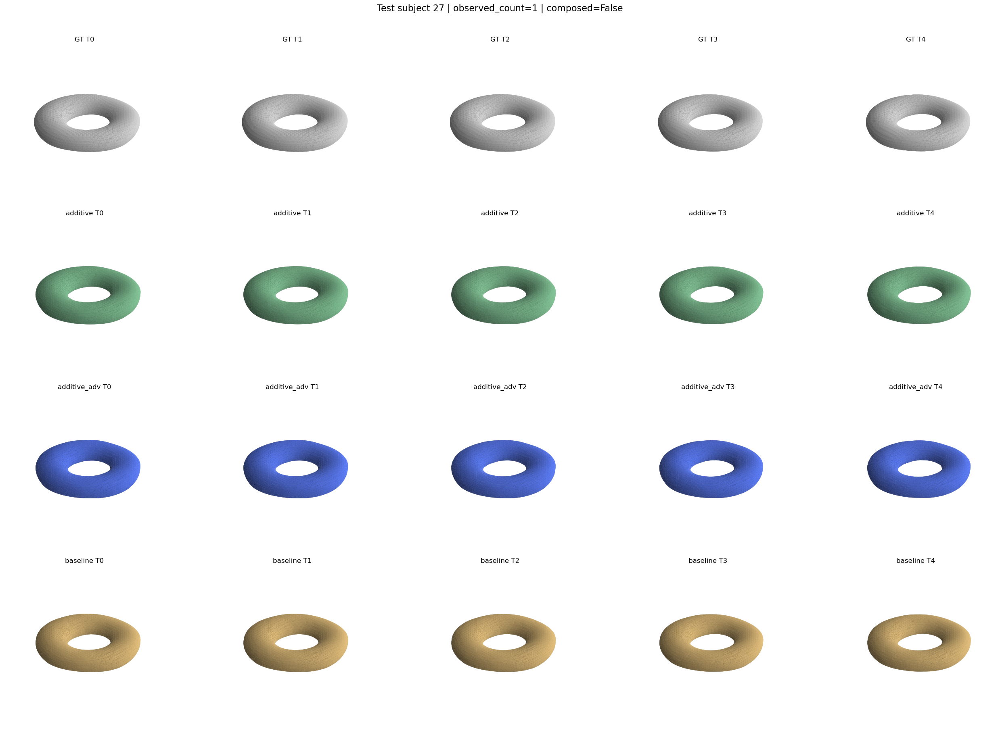

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,77.962471,0,0.001366,0.001375,0.001355
1,1,78.649971,0,0.001355,0.001354,0.001349
2,2,79.368477,0,0.001349,0.001344,0.001337
3,3,81.046677,0,0.001352,0.001310,0.001284
4,4,81.998978,0,0.001353,0.001287,0.001271


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_4_obs_1_direct.png


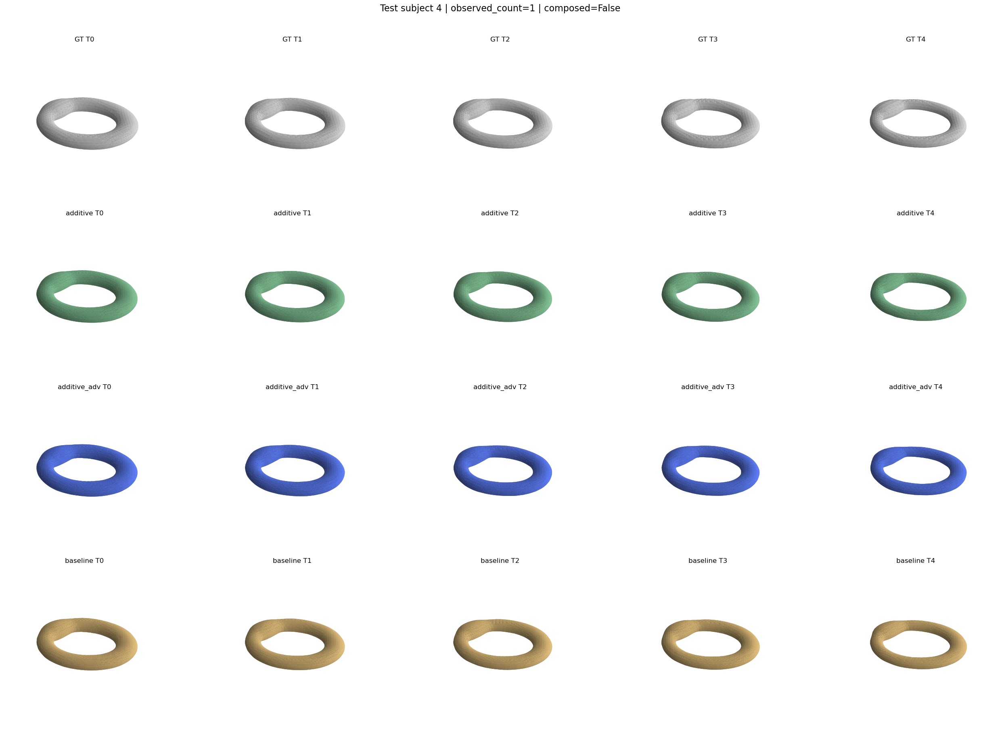

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,78.753929,1,0.000596,0.000598,0.000615
1,1,80.586525,1,0.000506,0.000535,0.000501
2,2,82.017929,1,0.000448,0.000487,0.000449
3,3,82.758339,1,0.000419,0.000467,0.000429
4,4,84.678932,1,0.000385,0.000422,0.000379


In [5]:
# ---- GT vs predicted trajectories: additive vs adversarial additive vs baseline ----

def forecast_rows(model_entry, records, observed_count=1, composed=False, max_dt=COMPOSED_MAX_DT_VIS):
    decoder_obj = model_entry['decoder']
    flow_obj = model_entry['flow']
    specs_obj = model_entry['specs']
    anchor, loss_hist = fit_anchor_for_model(decoder_obj, flow_obj, specs_obj, records, observed_count=observed_count)
    baseline_t = float(records[0]['time'])
    rows = []
    for r in records:
        cond_t = condition_for_record(r, device=anchor.device, dtype=anchor.dtype)
        z_t = predict_latent_from_anchor(flow_obj, anchor, baseline_t, float(r['time']), cond_t=cond_t, composed=composed, max_dt=max_dt)
        pred_mesh = latent_to_mesh(decoder_obj, z_t, grid_res=GRID_RES_VIS)
        gt_mesh = as_mesh(trimesh.load(r['gt_path'], process=False))
        rows.append({
            'title': f"T{int(r['tp_user'])}",
            'gt_mesh': gt_mesh,
            'pred_mesh': pred_mesh,
            'record': r,
            'latent': z_t.detach().cpu(),
            'chamfer': symmetric_chamfer(pred_mesh, gt_mesh, n=SAMPLES_CHAMFER),
        })
    return anchor, loss_hist, rows


def plot_gt_pred_comparison(rows_dict, subject_label, save_name=None):
    model_names = ['gt'] + list(rows_dict.keys())
    ref_rows = next(iter(rows_dict.values()))
    n = len(ref_rows)
    meshes = []
    for i in range(n):
        meshes.append(ref_rows[i]['gt_mesh'])
        for name in rows_dict:
            meshes.append(rows_dict[name][i]['pred_mesh'])
    mins, maxs = _mesh_bounds(meshes)
    fig = plt.figure(figsize=(5.2 * n, 4.6 * len(model_names)))
    for i in range(n):
        ax = fig.add_subplot(len(model_names), n, i + 1, projection='3d')
        draw_mesh(ax, ref_rows[i]['gt_mesh'], 'GT ' + ref_rows[i]['title'], color='#d9d9d9', mins=mins, maxs=maxs)
        for row_idx, name in enumerate(rows_dict.keys(), start=1):
            rr = rows_dict[name][i]
            ax = fig.add_subplot(len(model_names), n, row_idx * n + i + 1, projection='3d')
            draw_mesh(ax, rr['pred_mesh'], f'{name} {rr["title"]}', color=MODELS[name]['color'], mins=mins, maxs=maxs)
    plt.suptitle(subject_label, fontsize=16, y=0.995)
    fig.subplots_adjust(left=0.005, right=0.995, bottom=0.02, top=0.94, wspace=0.0, hspace=0.08)
    out_path = save_figure(fig, save_name or subject_label)
    plt.show()
    return out_path


def compare_subject(sid, observed_count=1, composed=False):
    recs = TEST_META['subject_to_records'][sid]
    out = {}
    for name, model_entry in MODELS.items():
        anchor, hist, rows = forecast_rows(model_entry, recs, observed_count=observed_count, composed=composed)
        out[name] = {'anchor': anchor, 'loss_hist': hist, 'rows': rows}
    comparison_fig_path = plot_gt_pred_comparison(
        {k: v['rows'] for k, v in out.items()},
        f'Test subject {sid} | observed_count={observed_count} | composed={composed}',
        save_name=f'compare_subject_sid_{sid}_obs_{observed_count}_{"composed" if composed else "direct"}',
    )
    df = pd.DataFrame({
        'tp_user': [r['record']['tp_user'] for r in out['additive']['rows']],
        'age': [r['record']['age'] for r in out['additive']['rows']],
        'diagnosis': [r['record']['diagnosis'] for r in out['additive']['rows']],
        'baseline_chamfer': [r['chamfer'] for r in out['baseline']['rows']],
        'additive_chamfer': [r['chamfer'] for r in out['additive']['rows']],
        'additive_adv_chamfer': [r['chamfer'] for r in out['additive_adv']['rows']],
    })
    display(df)
    out['records'] = recs
    out['comparison_fig_path'] = comparison_fig_path
    return out

healthy_cmp = compare_subject(TEST_SID_HEALTHY, observed_count=1, composed=False)
diseased_cmp = compare_subject(TEST_SID_DISEASED, observed_count=1, composed=False)


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/additive_traversal_healthy_sid_27_visit_last.png


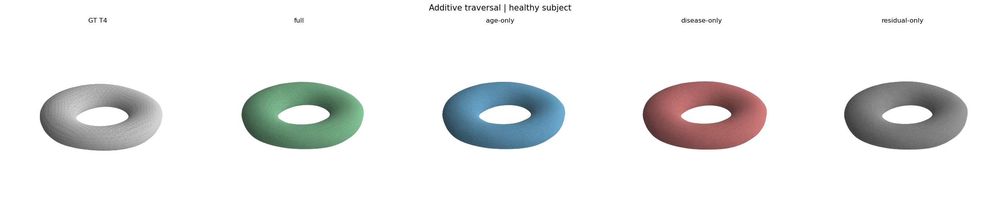

Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/additive_traversal_diseased_sid_4_visit_last.png


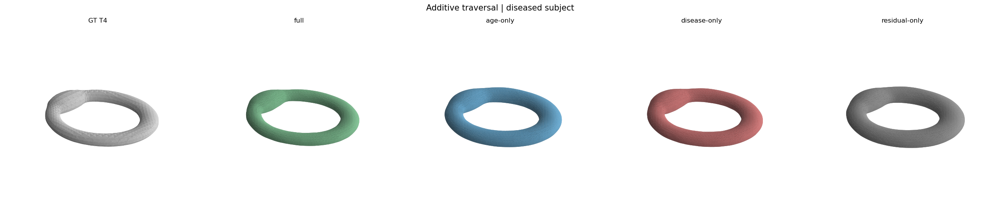

Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/additive_traversal_diseased_sid_4_forced_diag_0.png


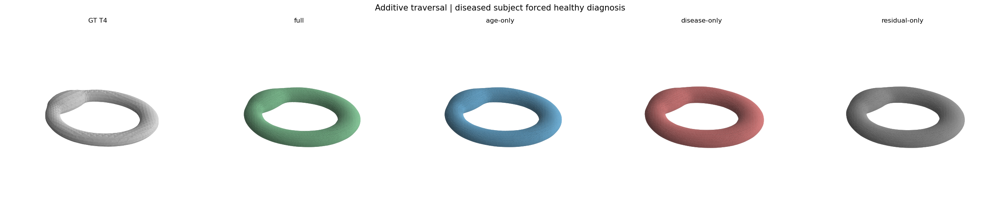

Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/additive_traversal_healthy_sid_27_forced_diag_1.png


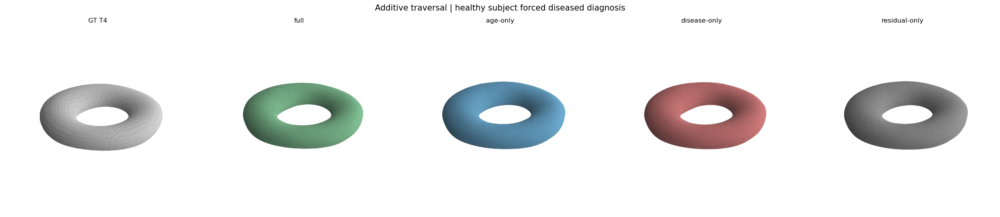

PosixPath('/home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/additive_traversal_healthy_sid_27_forced_diag_1.png')

In [6]:
# ---- Additive component traversals and diagnosis counterfactuals ----

def component_traversal(model_name, anchor, records, visit_index=-1, force_diagnosis=None):
    rec = records[int(visit_index)]
    target_t = float(rec['time'])
    baseline_t = float(records[0]['time'])
    cond_t = condition_for_record(rec, device=anchor.device, dtype=anchor.dtype)
    if force_diagnosis is not None:
        cond_t = condition_for_diagnosis(int(force_diagnosis), device=anchor.device, dtype=anchor.dtype)
    flow_obj = MODELS[model_name]['flow']
    decoder_obj = MODELS[model_name]['decoder']
    comp = additive_component_vectors(flow_obj, anchor, baseline_t, target_t, cond_t)
    dt = float(target_t - baseline_t)
    z_full = anchor + dt * comp['velocity']
    z_age = anchor + dt * comp['age']
    z_disease = anchor + dt * comp['disease']
    z_residual = anchor + dt * comp['residual']
    return [
        {'mesh': as_mesh(trimesh.load(rec['gt_path'], process=False)), 'title': f'GT T{int(rec["tp_user"])}', 'color': '#d9d9d9'},
        {'mesh': latent_to_mesh(decoder_obj, z_full, grid_res=GRID_RES_ANALYSIS), 'title': 'full', 'color': '#82c596'},
        {'mesh': latent_to_mesh(decoder_obj, z_age, grid_res=GRID_RES_ANALYSIS), 'title': 'age-only', 'color': '#6baed6'},
        {'mesh': latent_to_mesh(decoder_obj, z_disease, grid_res=GRID_RES_ANALYSIS), 'title': 'disease-only', 'color': '#d77b7b'},
        {'mesh': latent_to_mesh(decoder_obj, z_residual, grid_res=GRID_RES_ANALYSIS), 'title': 'residual-only', 'color': '#9b9b9b'},
    ]

plot_mesh_grid(
    component_traversal('additive', healthy_cmp['additive']['anchor'], healthy_cmp['records'], visit_index=-1),
    'Additive traversal | healthy subject',
    save_name=f'additive_traversal_healthy_sid_{TEST_SID_HEALTHY}_visit_last',
)
plot_mesh_grid(
    component_traversal('additive', diseased_cmp['additive']['anchor'], diseased_cmp['records'], visit_index=-1),
    'Additive traversal | diseased subject',
    save_name=f'additive_traversal_diseased_sid_{TEST_SID_DISEASED}_visit_last',
)
plot_mesh_grid(
    component_traversal('additive', diseased_cmp['additive']['anchor'], diseased_cmp['records'], visit_index=-1, force_diagnosis=0),
    'Additive traversal | diseased subject forced healthy diagnosis',
    save_name=f'additive_traversal_diseased_sid_{TEST_SID_DISEASED}_forced_diag_0',
)
plot_mesh_grid(
    component_traversal('additive', healthy_cmp['additive']['anchor'], healthy_cmp['records'], visit_index=-1, force_diagnosis=1),
    'Additive traversal | healthy subject forced diseased diagnosis',
    save_name=f'additive_traversal_healthy_sid_{TEST_SID_HEALTHY}_forced_diag_1',
)


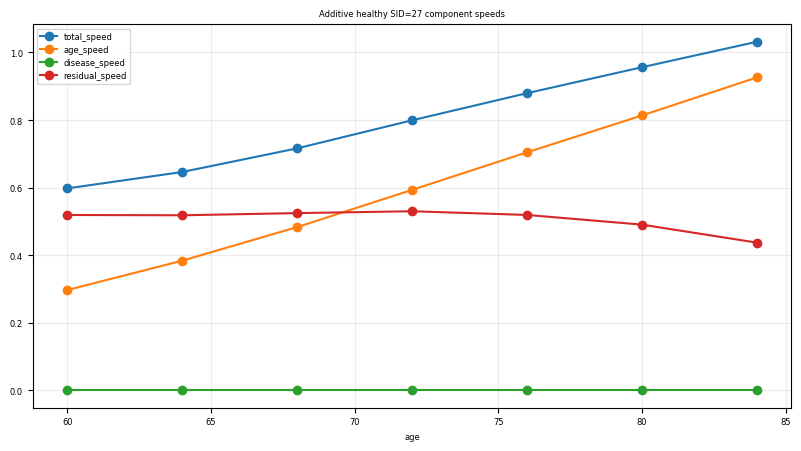

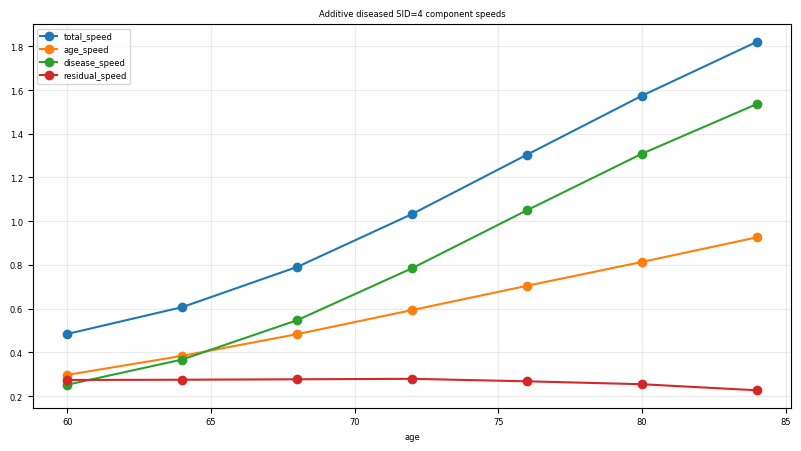

In [7]:
# ---- Component speed curves across age ----

def age_to_time_value(age_years):
    if age_slope is None or age_intercept is None:
        raise RuntimeError('Could not estimate age to age_norm mapping from labels.')
    return float(age_slope * age_years + age_intercept)


def component_speed_curve(model_name, anchor, records, diagnosis_override=None, ages=None):
    if ages is None:
        ages = np.linspace(np.nanmin(LABEL_DF['age']), np.nanmax(LABEL_DF['age']), 8)
    baseline_t = float(records[0]['time'])
    rows = []
    for age in ages:
        t_tar = float(np.clip(age_to_time_value(age), TEST_META['global_min'], TEST_META['global_max']))
        d_val = records[0]['diagnosis'] if diagnosis_override is None else int(diagnosis_override)
        cond_t = condition_for_diagnosis(d_val, device=anchor.device, dtype=anchor.dtype)
        z_t = predict_latent_from_anchor(MODELS[model_name]['flow'], anchor, baseline_t, t_tar, cond_t=cond_t, composed=False)
        speeds = latent_speed_components(MODELS[model_name]['flow'], z_t, t_tar, cond_t)
        speeds['age'] = float(age)
        rows.append(speeds)
    return pd.DataFrame(rows)

ages_eval = np.arange(60, 86, 4)
curve_h = component_speed_curve('additive', healthy_cmp['additive']['anchor'], healthy_cmp['records'], diagnosis_override=0, ages=ages_eval)
curve_d = component_speed_curve('additive', diseased_cmp['additive']['anchor'], diseased_cmp['records'], diagnosis_override=1, ages=ages_eval)
plot_metric_curves(curve_h, f'Additive healthy SID={TEST_SID_HEALTHY} component speeds')
plot_metric_curves(curve_d, f'Additive diseased SID={TEST_SID_DISEASED} component speeds')


In [8]:
# ---- Held-out component extraction for leakage / probe analysis ----

train_anchor_weights = load_train_subject_anchors(EXP_DIR, checkpoint=CHECKPOINT)
train_sid_to_idx = {sid: i for i, sid in enumerate(TRAIN_META['subject_ids_sorted'])}


def extract_train_features(max_subjects=None):
    rows = []
    subject_ids = TRAIN_META['subject_ids_sorted']
    if max_subjects is not None:
        subject_ids = subject_ids[:int(max_subjects)]
    for sid in subject_ids:
        if sid not in train_sid_to_idx:
            continue
        anchor = train_anchor_weights[train_sid_to_idx[sid]].to(DEVICE).view(1, -1)
        recs = TRAIN_META['subject_to_records'][sid]
        baseline_t = float(recs[0]['time'])
        for rec in recs:
            cond_t = condition_for_record(rec, device=anchor.device, dtype=anchor.dtype)
            comp = additive_component_vectors(MODELS['additive']['flow'], anchor, baseline_t, float(rec['time']), cond_t)
            rows.append({
                'split': 'train',
                'subject_id': sid,
                'diagnosis': int(rec['diagnosis']),
                'age': float(rec['age']),
                'delta_age': float(rec['time'] - baseline_t),
                'time_index': int(rec.get('tp_user', 0)),
                'bump_height': float(rec.get('bump_height', np.nan)),
                'bump_speed_gt': float(rec.get('bump_speed_gt', np.nan)),
                'age_vec': comp['age'].detach().cpu().numpy().reshape(-1),
                'disease_vec': comp['disease'].detach().cpu().numpy().reshape(-1),
                'residual_vec': comp['residual'].detach().cpu().numpy().reshape(-1),
                'full_vec': comp['velocity'].detach().cpu().numpy().reshape(-1),
            })
    return rows


def extract_test_features(observed_count=1, max_subjects=None):
    rows = []
    subject_ids = TEST_META['subject_ids_sorted']
    if max_subjects is not None:
        subject_ids = subject_ids[:int(max_subjects)]
    for sid in subject_ids:
        recs = TEST_META['subject_to_records'][sid]
        try:
            anchor, _ = fit_anchor_for_model(MODELS['additive']['decoder'], MODELS['additive']['flow'], MODELS['additive']['specs'], recs, observed_count=observed_count)
        except Exception as e:
            print(f'[warn] test subject {sid} skipped: {e}')
            continue
        baseline_t = float(recs[0]['time'])
        for rec in recs:
            cond_t = condition_for_record(rec, device=anchor.device, dtype=anchor.dtype)
            comp = additive_component_vectors(MODELS['additive']['flow'], anchor, baseline_t, float(rec['time']), cond_t)
            rows.append({
                'split': 'test',
                'subject_id': sid,
                'diagnosis': int(rec['diagnosis']),
                'age': float(rec['age']),
                'delta_age': float(rec['time'] - baseline_t),
                'time_index': int(rec.get('tp_user', 0)),
                'bump_height': float(rec.get('bump_height', np.nan)),
                'bump_speed_gt': float(rec.get('bump_speed_gt', np.nan)),
                'age_vec': comp['age'].detach().cpu().numpy().reshape(-1),
                'disease_vec': comp['disease'].detach().cpu().numpy().reshape(-1),
                'residual_vec': comp['residual'].detach().cpu().numpy().reshape(-1),
                'full_vec': comp['velocity'].detach().cpu().numpy().reshape(-1),
            })
    return rows

rows_train = extract_train_features(max_subjects=MAX_TRAIN_SUBJECTS_FOR_PROBES)
rows_test = extract_test_features(observed_count=1, max_subjects=MAX_TEST_SUBJECTS_FOR_PROBES)
print('train feature rows:', len(rows_train), '| test feature rows:', len(rows_test))
FEATURE_ROWS = rows_train + rows_test


Loaded train anchors: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/LatentCodes/latest.pth (80, 256)


train feature rows: 240 | test feature rows: 60


,component,age_r2,age_mae,disease_auc,disease_acc,disease_auc_age_matched
0,age,5.264117e-01,0.004973,0.557714,0.500000,0.502959
1,disease,-3.851631e+03,0.751874,1.000000,0.833333,1.000000
2,residual,-1.012729e+06,29.260846,0.964571,0.816667,0.911243
3,full,-2.008414e+02,0.398939,1.000000,1.000000,1.000000


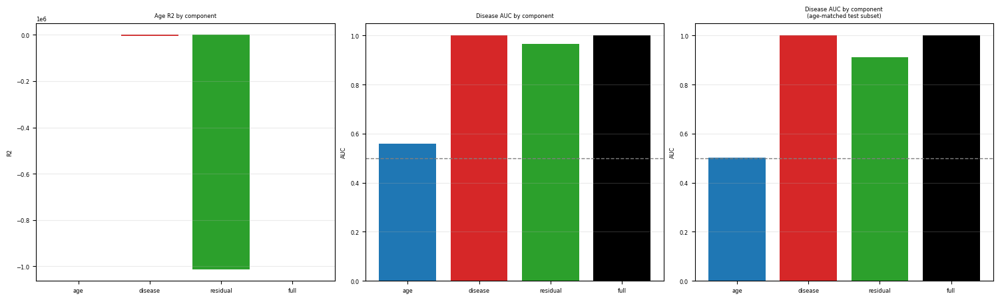

In [9]:
# ---- Leakage matrix and probes ----

def fit_eval_age_probe(train_rows, test_rows, vec_key):
    Xtr = np.stack([r[vec_key] for r in train_rows])
    ytr = np.array([r['delta_age'] for r in train_rows], dtype=float)
    Xte = np.stack([r[vec_key] for r in test_rows])
    yte = np.array([r['delta_age'] for r in test_rows], dtype=float)
    reg = LinearRegression().fit(Xtr, ytr)
    pred = reg.predict(Xte)
    return {'r2': float(r2_score(yte, pred)), 'mae': float(mean_absolute_error(yte, pred))}


def fit_eval_disease_probe(train_rows, test_rows, vec_key):
    Xtr = np.stack([r[vec_key] for r in train_rows])
    ytr = np.array([r['diagnosis'] for r in train_rows], dtype=int)
    Xte = np.stack([r[vec_key] for r in test_rows])
    yte = np.array([r['diagnosis'] for r in test_rows], dtype=int)
    clf = LogisticRegression(max_iter=2000).fit(Xtr, ytr)
    prob = clf.predict_proba(Xte)[:, 1]
    pred = (prob >= 0.5).astype(int)
    return {
        'auc': float(roc_auc_score(yte, prob)) if len(np.unique(yte)) > 1 else np.nan,
        'acc': float(accuracy_score(yte, pred)),
    }


def age_matched_subset(rows, max_per_bin=12, bin_width=2.5):
    df = pd.DataFrame([{k: r[k] for k in ['split', 'subject_id', 'diagnosis', 'age', 'delta_age']} for r in rows])
    df['bin'] = (df['age'] / float(bin_width)).round().astype(int)
    keep_idx = []
    for _, g in df.groupby('bin'):
        g0 = g[g['diagnosis'] == 0].index.tolist()
        g1 = g[g['diagnosis'] == 1].index.tolist()
        take = min(len(g0), len(g1), int(max_per_bin))
        keep_idx.extend(g0[:take])
        keep_idx.extend(g1[:take])
    keep_idx = sorted(set(int(i) for i in keep_idx))
    return [rows[i] for i in keep_idx]

train_probe = [r for r in FEATURE_ROWS if r['split'] == 'train']
test_probe = [r for r in FEATURE_ROWS if r['split'] == 'test']
matched_test_probe = age_matched_subset(test_probe)

vec_keys = ['age_vec', 'disease_vec', 'residual_vec', 'full_vec']
name_map = {'age_vec': 'age', 'disease_vec': 'disease', 'residual_vec': 'residual', 'full_vec': 'full'}
probe_rows = []
for vk in vec_keys:
    age_stats = fit_eval_age_probe(train_probe, test_probe, vk)
    dis_stats = fit_eval_disease_probe(train_probe, test_probe, vk)
    dis_matched = fit_eval_disease_probe(train_probe, matched_test_probe, vk) if matched_test_probe else {'auc': np.nan, 'acc': np.nan}
    probe_rows.append({
        'component': name_map[vk],
        'age_r2': age_stats['r2'],
        'age_mae': age_stats['mae'],
        'disease_auc': dis_stats['auc'],
        'disease_acc': dis_stats['acc'],
        'disease_auc_age_matched': dis_matched['auc'],
    })
PROBE_DF = pd.DataFrame(probe_rows)
display(PROBE_DF)

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
axes[0].bar(PROBE_DF['component'], PROBE_DF['age_r2'], color=['tab:blue', 'tab:red', 'tab:green', 'black'])
axes[0].set_title('Age R2 by component')
axes[0].set_ylabel('R2')
axes[0].grid(axis='y', alpha=0.25)

axes[1].bar(PROBE_DF['component'], PROBE_DF['disease_auc'], color=['tab:blue', 'tab:red', 'tab:green', 'black'])
axes[1].axhline(0.5, color='gray', linestyle='--', linewidth=1)
axes[1].set_title('Disease AUC by component')
axes[1].set_ylabel('AUC')
axes[1].grid(axis='y', alpha=0.25)

axes[2].bar(PROBE_DF['component'], PROBE_DF['disease_auc_age_matched'], color=['tab:blue', 'tab:red', 'tab:green', 'black'])
axes[2].axhline(0.5, color='gray', linestyle='--', linewidth=1)
axes[2].set_title('Disease AUC by component\n(age-matched test subset)')
axes[2].set_ylabel('AUC')
axes[2].grid(axis='y', alpha=0.25)
plt.tight_layout()
plt.show()


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/counterfactual_diag_0_from_id_027_t0.png


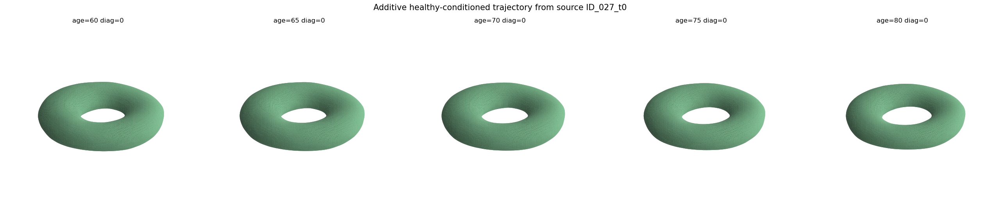

Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/counterfactual_diag_1_from_id_027_t0.png


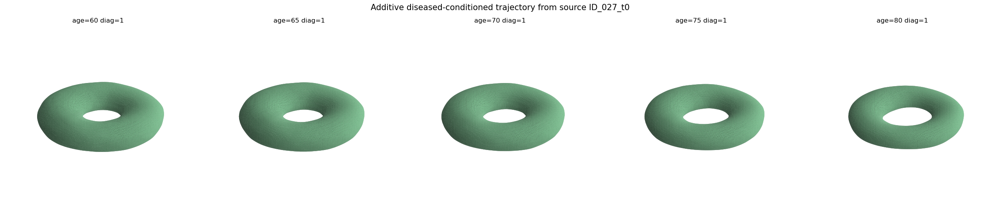

PosixPath('/home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/counterfactual_diag_1_from_id_027_t0.png')

In [10]:
# ---- Counterfactual diagnosis trajectories from the same fitted subject ----

def counterfactual_trajectory(model_name, anchor, source_record, diagnosis_values=(0, 1), age_years=None):
    if age_years is None:
        age_years = np.arange(55, 86, 5)
    baseline_t = float(source_record['time'])
    out = []
    for d in diagnosis_values:
        rows = []
        for age in age_years:
            t_tar = float(np.clip(age_to_time_value(age), TEST_META['global_min'], TEST_META['global_max']))
            cond_t = condition_for_diagnosis(int(d), device=anchor.device, dtype=anchor.dtype)
            z_t = predict_latent_from_anchor(MODELS[model_name]['flow'], anchor, baseline_t, t_tar, cond_t=cond_t, composed=False)
            rows.append({
                'mesh': latent_to_mesh(MODELS[model_name]['decoder'], z_t, grid_res=GRID_RES_ANALYSIS),
                'title': f'age={age:.0f} diag={int(d)}',
                'age': age,
                'diagnosis': int(d),
                'color': MODELS[model_name]['color'],
            })
        out.append(rows)
    return out

source_rec = healthy_cmp['records'][0]
cf_rows_h, cf_rows_d = counterfactual_trajectory('additive', healthy_cmp['additive']['anchor'], source_rec, diagnosis_values=(0, 1), age_years=np.arange(60, 86, 5))
plot_mesh_grid(
    cf_rows_h[:5],
    f'Additive healthy-conditioned trajectory from source {source_rec["name"]}',
    save_name=f'counterfactual_diag_0_from_{source_rec["name"]}',
)
plot_mesh_grid(
    cf_rows_d[:5],
    f'Additive diseased-conditioned trajectory from source {source_rec["name"]}',
    save_name=f'counterfactual_diag_1_from_{source_rec["name"]}',
)


[info] no keys for Additive experiment: reconstruction / pair / cocycle losses: ['rec', 'recon', 'pair', 'cyc', 'cocycle']
[info] no keys for Additive experiment: disentanglement / regularization losses: ['dis', 'res', 'adv', 'leak', 'zero', 'code', 'eik', 'probe', 'orth']


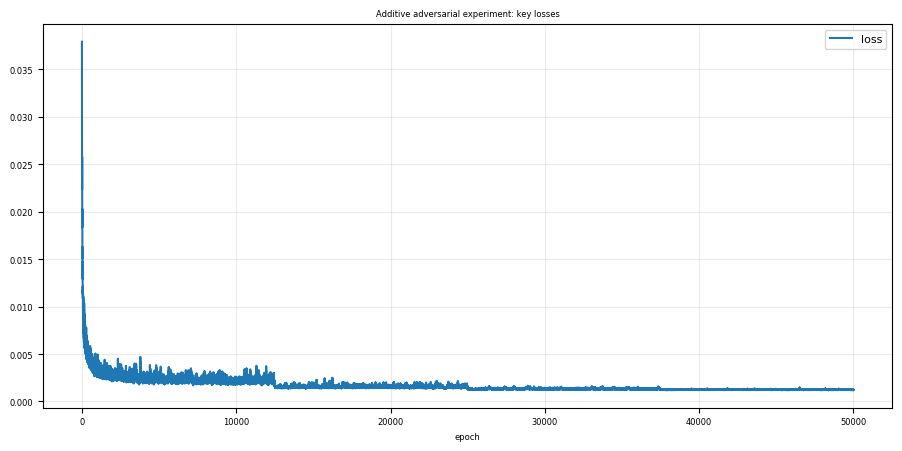

[info] no keys for Baseline experiment: reconstruction / pair / cocycle losses: ['rec', 'recon', 'pair', 'cyc', 'cocycle']


[]

In [11]:
# ---- Training dynamics from Logs.pth ----

def load_logs(log_path):
    if not Path(log_path).exists():
        print(f'[warn] missing logs: {log_path}')
        return None
    return torch.load(log_path, map_location='cpu')


def candidate_log_keys(logs, patterns):
    keys = []
    for k, v in logs.items():
        if not isinstance(v, list) or len(v) == 0:
            continue
        name = str(k).lower()
        if any(p in name for p in patterns):
            try:
                float(v[-1])
            except Exception:
                continue
            keys.append(k)
    return sorted(set(keys))


def plot_log_group(logs, title, patterns, max_keys=10):
    if logs is None:
        return []
    keys = candidate_log_keys(logs, patterns)[:max_keys]
    if not keys:
        print(f'[info] no keys for {title}: {patterns}')
        return []
    plt.figure(figsize=(9, 4.5))
    for k in keys:
        vals = np.asarray(logs[k], dtype=float)
        plt.plot(np.arange(1, len(vals) + 1), vals, label=k)
    plt.title(title)
    plt.xlabel('epoch')
    plt.grid(alpha=0.25)
    plt.legend(fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()
    return keys

logs_cur = load_logs(EXP_DIR / 'Logs.pth')
logs_adv = load_logs(ADV_EXP_DIR / 'Logs.pth')
logs_base = load_logs(BASELINE_EXP_DIR / 'Logs.pth')

plot_log_group(logs_cur, 'Additive experiment: reconstruction / pair / cocycle losses', ['rec', 'recon', 'pair', 'cyc', 'cocycle'])
plot_log_group(logs_cur, 'Additive experiment: disentanglement / regularization losses', ['dis', 'res', 'adv', 'leak', 'zero', 'code', 'eik', 'probe', 'orth'])
plot_log_group(logs_adv, 'Additive adversarial experiment: key losses', ['rec', 'dis', 'res', 'adv', 'leak', 'probe', 'orth', 'loss'])
plot_log_group(logs_base, 'Baseline experiment: reconstruction / pair / cocycle losses', ['rec', 'recon', 'pair', 'cyc', 'cocycle'])


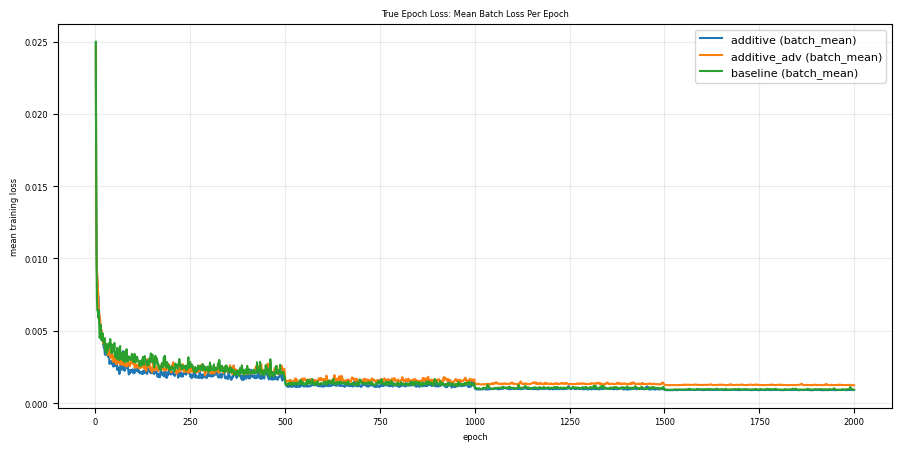

,run,raw_loss_points,epoch_count,batches_per_epoch,plotted
0,additive,50000,2000,25.0,True
1,additive_adv,50000,2000,25.0,True
2,baseline,50000,2000,25.0,True


: 

In [ ]:
# ---- True epoch loss from per-batch Logs.pth ----
# The raw `loss` key is logged once per batch. This cell aggregates it to epoch means.

def infer_epoch_count(logs):
    if logs is None:
        return None
    for key in ['timing', 'learning_rate', 'latent_magnitude']:
        value = logs.get(key)
        if isinstance(value, list) and len(value) > 0:
            return len(value)
    for key, value in logs.items():
        if str(key).endswith('_epoch') and isinstance(value, list) and len(value) > 0:
            return len(value)
    return None


def epoch_loss_series(logs):
    if logs is None or 'loss' not in logs or not isinstance(logs['loss'], list):
        return None
    raw = np.asarray(logs['loss'], dtype=float)
    if raw.size == 0:
        return None
    n_epochs = infer_epoch_count(logs)
    if n_epochs is None or n_epochs <= 0:
        return pd.DataFrame({'epoch': np.arange(1, raw.size + 1), 'loss': raw, 'source': 'raw_steps'})
    if raw.size == n_epochs:
        return pd.DataFrame({'epoch': np.arange(1, n_epochs + 1), 'loss': raw, 'source': 'epoch_logged'})
    chunks = np.array_split(raw, n_epochs)
    means = np.asarray([c.mean() for c in chunks if len(c) > 0], dtype=float)
    return pd.DataFrame({'epoch': np.arange(1, len(means) + 1), 'loss': means, 'source': 'batch_mean'})


def plot_true_epoch_losses(log_items):
    summary_rows = []
    fig, ax = plt.subplots(figsize=(9, 4.5))
    plotted = False
    for label, logs in log_items:
        if logs is None:
            summary_rows.append({'run': label, 'raw_loss_points': 0, 'epoch_count': None, 'batches_per_epoch': None, 'plotted': False})
            continue
        raw_loss = logs.get('loss', [])
        raw_count = len(raw_loss) if isinstance(raw_loss, list) else 0
        epoch_count = infer_epoch_count(logs)
        batches_per_epoch = (raw_count / epoch_count) if epoch_count else None
        df = epoch_loss_series(logs)
        summary_rows.append({
            'run': label,
            'raw_loss_points': raw_count,
            'epoch_count': epoch_count,
            'batches_per_epoch': batches_per_epoch,
            'plotted': df is not None,
        })
        if df is not None:
            ax.plot(df['epoch'], df['loss'], label=f'{label} ({df["source"].iloc[0]})')
            plotted = True
    ax.set_title('True Epoch Loss: Mean Batch Loss Per Epoch')
    ax.set_xlabel('epoch')
    ax.set_ylabel('mean training loss')
    ax.grid(alpha=0.25)
    if plotted:
        ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()
    display(pd.DataFrame(summary_rows))

plot_true_epoch_losses([
    ('additive', logs_cur),
    ('additive_adv', logs_adv),
    ('baseline', logs_base),
])


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_27_obs_1_direct.png


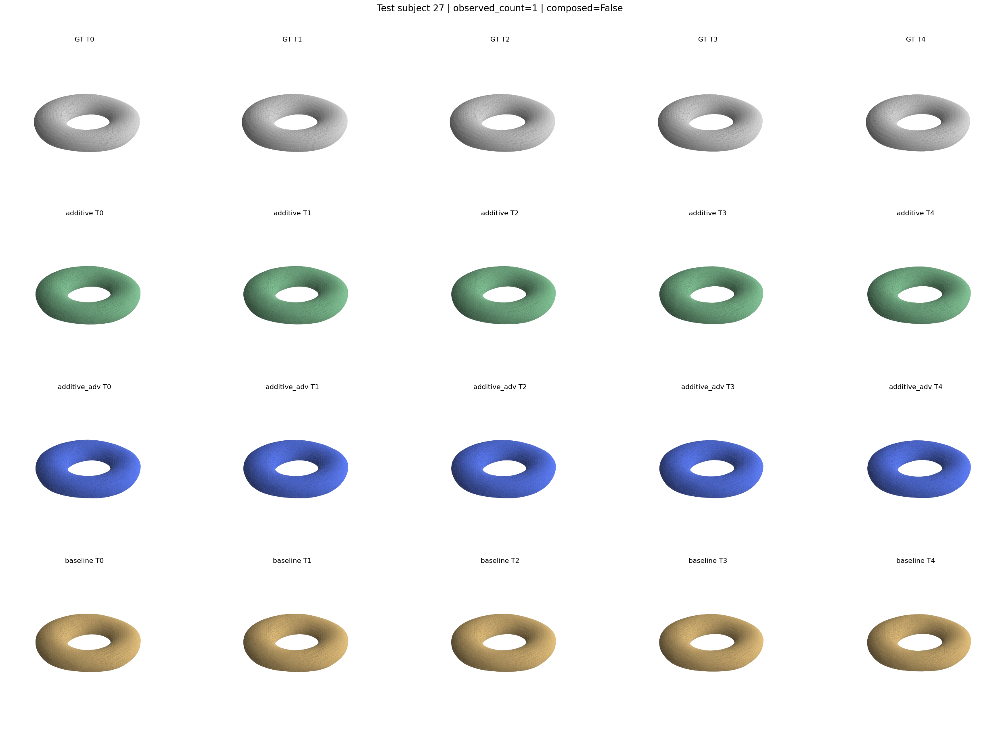

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,77.962471,0,0.001359,0.001370,0.001371
1,1,78.649971,0,0.001352,0.001362,0.001356
2,2,79.368477,0,0.001341,0.001348,0.001344
3,3,81.046677,0,0.001302,0.001310,0.001286
4,4,81.998978,0,0.001300,0.001305,0.001271


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_27_obs_1_composed.png


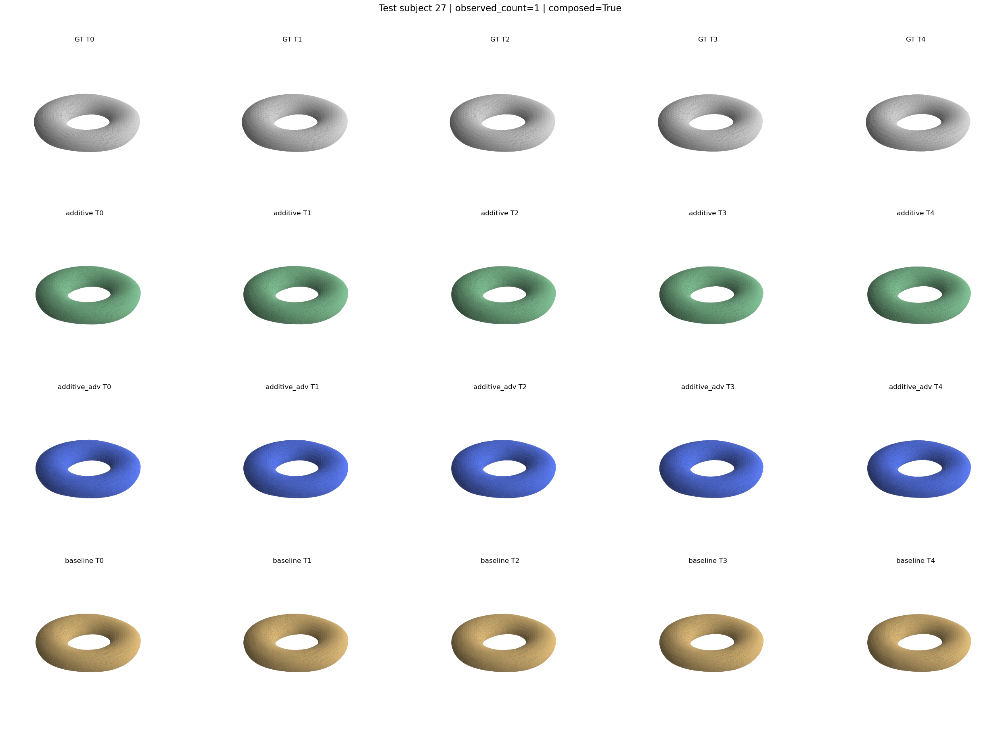

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,77.962471,0,0.001360,0.001349,0.001374
1,1,78.649971,0,0.001353,0.001338,0.001358
2,2,79.368477,0,0.001348,0.001344,0.001351
3,3,81.046677,0,0.001323,0.001306,0.001330
4,4,81.998978,0,0.001302,0.001308,0.001287


model              additive           additive_adv            baseline  \
rollout            composed    direct     composed    direct  composed   
tp_user age                                                              
0       77.962471  0.001349  0.001370     0.001374  0.001371  0.001360   
1       78.649971  0.001338  0.001362     0.001358  0.001356  0.001353   
2       79.368477  0.001344  0.001348     0.001351  0.001344  0.001348   
3       81.046677  0.001306  0.001310     0.001330  0.001286  0.001323   
4       81.998978  0.001308  0.001305     0.001287  0.001271  0.001302   

model                        
rollout              direct  
tp_user age                  
0       77.962471  0.001359  
1       78.649971  0.001352  
2       79.368477  0.001341  
3       81.046677  0.001302  
4       81.998978  0.001300

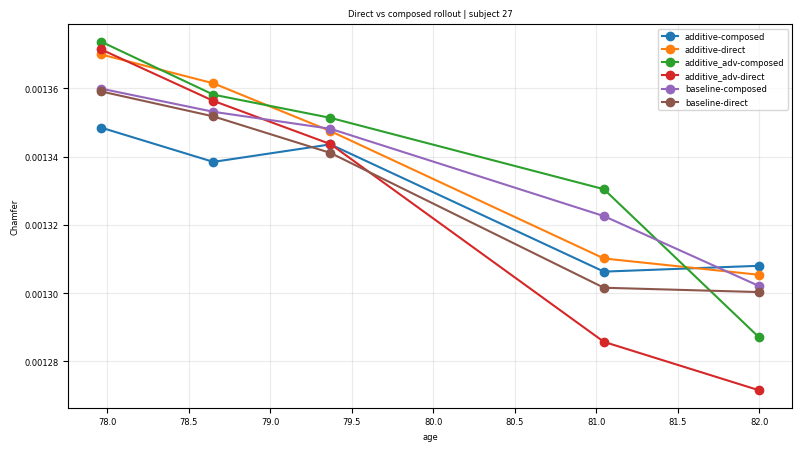

Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_4_obs_1_direct.png


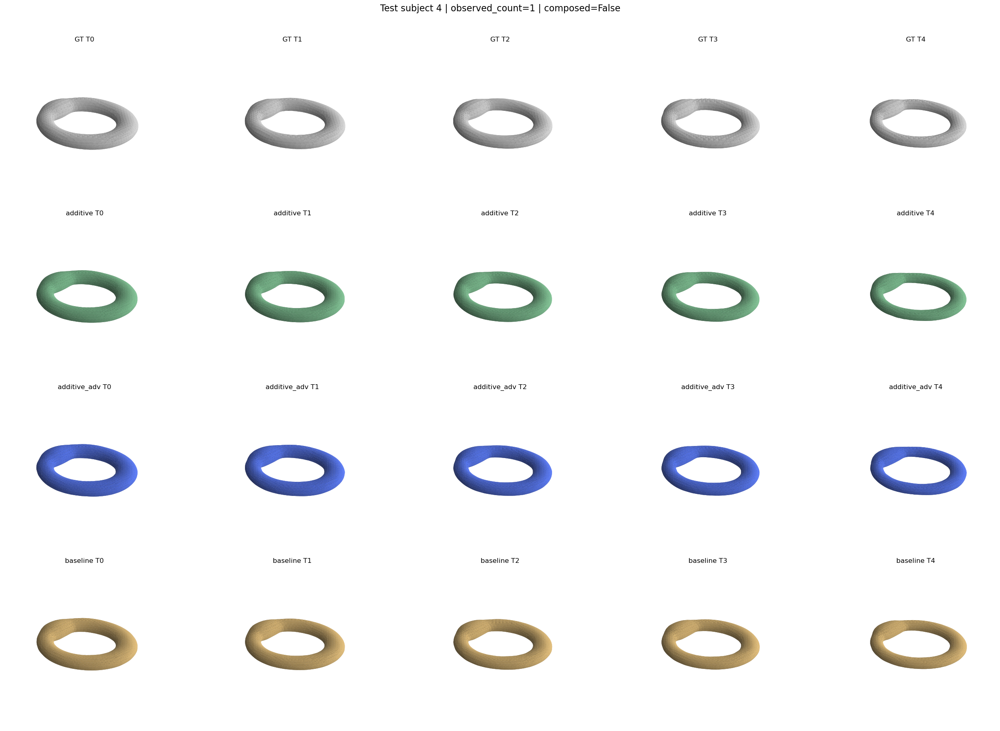

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,78.753929,1,0.000594,0.000594,0.000602
1,1,80.586525,1,0.000507,0.000524,0.000525
2,2,82.017929,1,0.000457,0.000481,0.000466
3,3,82.758339,1,0.000442,0.000451,0.000432
4,4,84.678932,1,0.000397,0.000387,0.000362


Saved figure: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/figures/compare_subject_sid_4_obs_1_composed.png


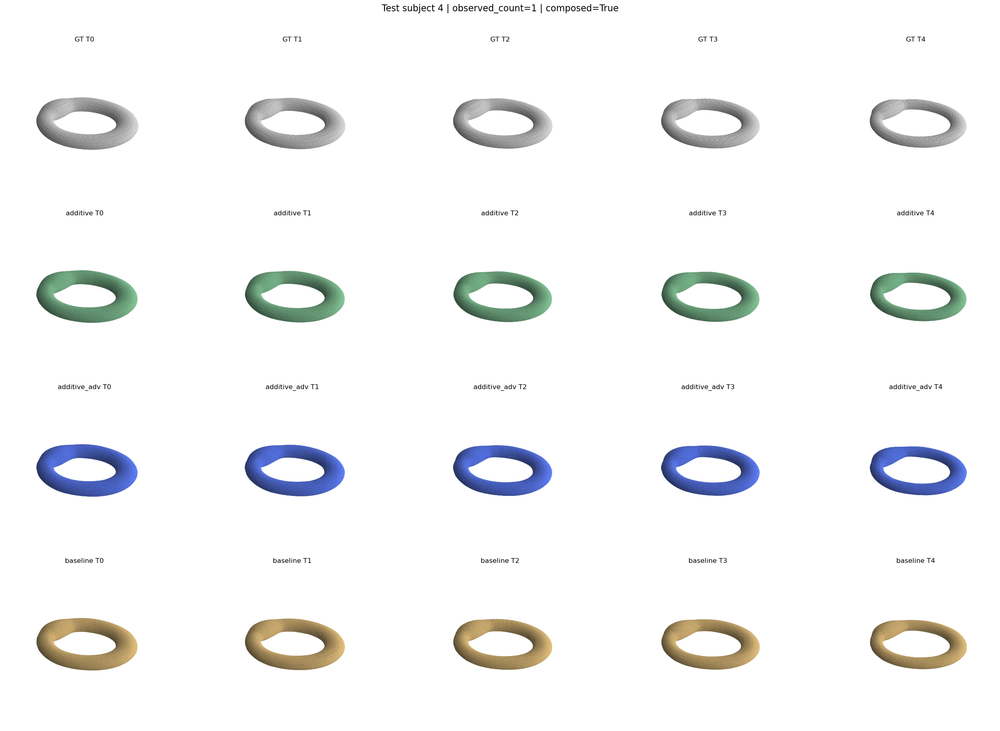

,tp_user,age,diagnosis,baseline_chamfer,additive_chamfer,additive_adv_chamfer
0,0,78.753929,1,0.000592,0.000590,0.000593
1,1,80.586525,1,0.000510,0.000520,0.000554
2,2,82.017929,1,0.000461,0.000494,0.000527
3,3,82.758339,1,0.000446,0.000464,0.000497
4,4,84.678932,1,0.000419,0.000404,0.000430


model              additive           additive_adv            baseline  \
rollout            composed    direct     composed    direct  composed   
tp_user age                                                              
0       78.753929  0.000590  0.000594     0.000593  0.000602  0.000592   
1       80.586525  0.000520  0.000524     0.000554  0.000525  0.000510   
2       82.017929  0.000494  0.000481     0.000527  0.000466  0.000461   
3       82.758339  0.000464  0.000451     0.000497  0.000432  0.000446   
4       84.678932  0.000404  0.000387     0.000430  0.000362  0.000419   

model                        
rollout              direct  
tp_user age                  
0       78.753929  0.000594  
1       80.586525  0.000507  
2       82.017929  0.000457  
3       82.758339  0.000442  
4       84.678932  0.000397

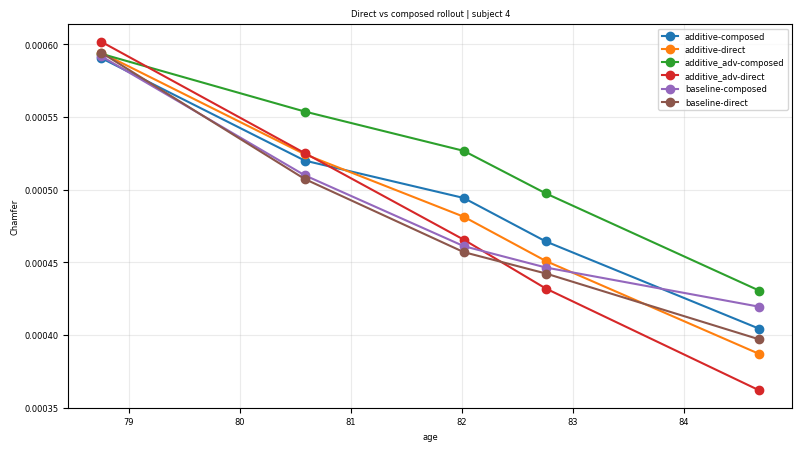

In [12]:
# ---- Direct vs composed rollout accuracy ----

def compare_direct_vs_composed(sid, observed_count=1):
    direct = compare_subject(sid, observed_count=observed_count, composed=False)
    composed = compare_subject(sid, observed_count=observed_count, composed=True)
    rows = []
    for kind, cmp_dict in [('direct', direct), ('composed', composed)]:
        for model_name in ['baseline', 'additive', 'additive_adv']:
            for rr in cmp_dict[model_name]['rows']:
                rows.append({
                    'subject_id': sid,
                    'model': model_name,
                    'rollout': kind,
                    'tp_user': rr['record']['tp_user'],
                    'age': rr['record']['age'],
                    'chamfer': rr['chamfer'],
                })
    df = pd.DataFrame(rows)
    display(df.pivot_table(index=['tp_user', 'age'], columns=['model', 'rollout'], values='chamfer'))
    fig, ax = plt.subplots(figsize=(8, 4.5))
    for (model, rollout), g in df.groupby(['model', 'rollout']):
        g = g.sort_values('age')
        ax.plot(g['age'], g['chamfer'], marker='o', label=f'{model}-{rollout}')
    ax.set_title(f'Direct vs composed rollout | subject {sid}')
    ax.set_xlabel('age')
    ax.set_ylabel('Chamfer')
    ax.grid(alpha=0.25)
    ax.legend()
    plt.tight_layout()
    plt.show()
    return df

rollout_df_healthy = compare_direct_vs_composed(TEST_SID_HEALTHY, observed_count=1)
rollout_df_diseased = compare_direct_vs_composed(TEST_SID_DISEASED, observed_count=1)


,split,subject_id,diagnosis,age,delta_age,time_index,bump_height,bump_speed_gt,age_norm,disease_norm,residual_norm,full_norm
0,train,0,1,77.595505,0.000000,0,5.213349,NaN,0.748359,1.152625,0.208085,1.391742
1,train,0,1,79.049309,0.036345,1,5.589939,NaN,0.760697,1.202356,0.212079,1.440035
2,train,0,1,80.678406,0.077073,2,6.059136,NaN,0.777411,1.258924,0.217489,1.496773
3,train,0,1,81.951141,0.108891,3,6.462135,NaN,0.792423,1.305228,0.220794,1.544022
4,train,0,1,83.689980,0.152362,4,7.067004,NaN,0.817223,1.377960,0.223917,1.619136


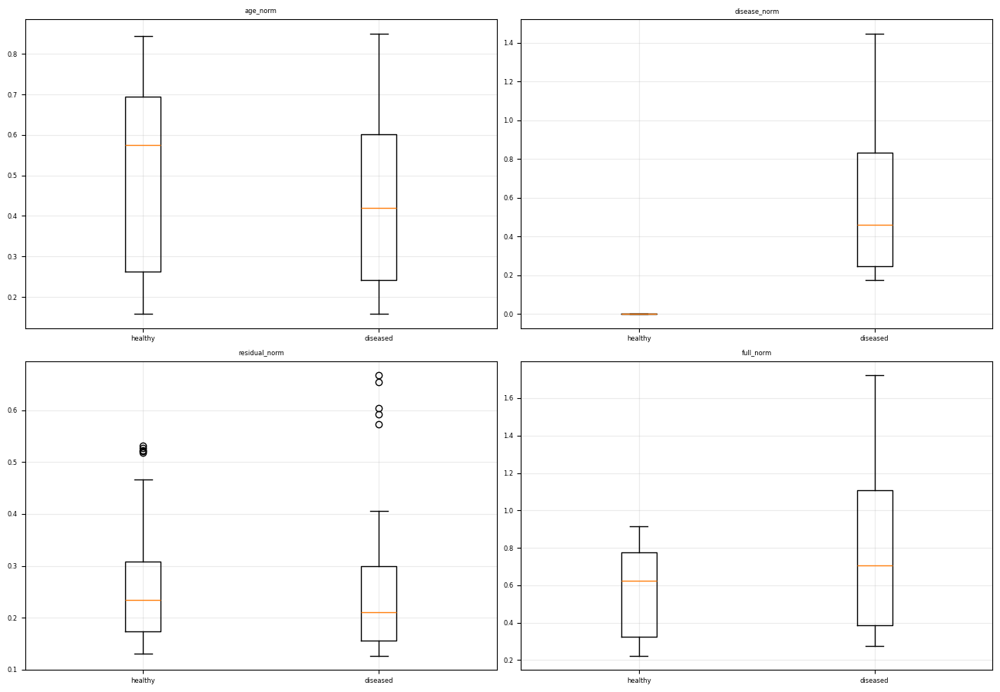

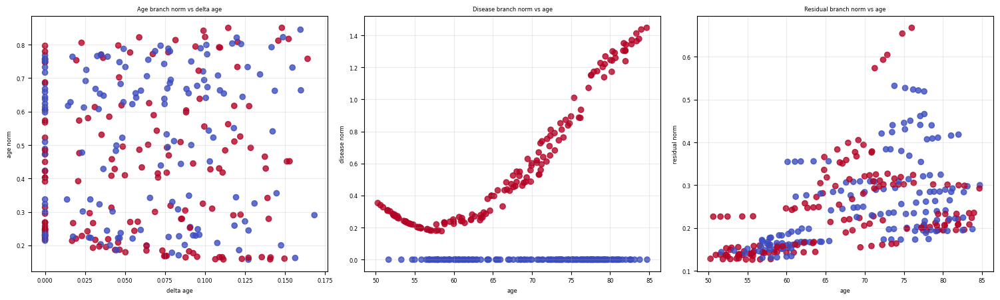

In [13]:
# ---- Component norm statistics and synthetic GT correlations ----

FEAT_DF = pd.DataFrame([
    {
        'split': r['split'],
        'subject_id': r['subject_id'],
        'diagnosis': r['diagnosis'],
        'age': r['age'],
        'delta_age': r['delta_age'],
        'time_index': r.get('time_index', np.nan),
        'bump_height': r.get('bump_height', np.nan),
        'bump_speed_gt': r.get('bump_speed_gt', np.nan),
        'age_norm': float(np.linalg.norm(r['age_vec'])),
        'disease_norm': float(np.linalg.norm(r['disease_vec'])),
        'residual_norm': float(np.linalg.norm(r['residual_vec'])),
        'full_norm': float(np.linalg.norm(r['full_vec'])),
    }
    for r in FEATURE_ROWS
])
display(FEAT_DF.head())

fig, axes = plt.subplots(2, 2, figsize=(13, 9))
for ax, col in zip(axes.ravel(), ['age_norm', 'disease_norm', 'residual_norm', 'full_norm']):
    data0 = FEAT_DF.loc[FEAT_DF['diagnosis'] == 0, col].dropna().values
    data1 = FEAT_DF.loc[FEAT_DF['diagnosis'] == 1, col].dropna().values
    ax.boxplot([data0, data1], tick_labels=['healthy', 'diseased'])
    ax.set_title(col)
    ax.grid(alpha=0.25)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
axes[0].scatter(FEAT_DF['delta_age'], FEAT_DF['age_norm'], c=FEAT_DF['diagnosis'], cmap='coolwarm', alpha=0.8)
axes[0].set_title('Age branch norm vs delta age')
axes[0].set_xlabel('delta age')
axes[0].set_ylabel('age norm')
axes[0].grid(alpha=0.25)

axes[1].scatter(FEAT_DF['age'], FEAT_DF['disease_norm'], c=FEAT_DF['diagnosis'], cmap='coolwarm', alpha=0.8)
axes[1].set_title('Disease branch norm vs age')
axes[1].set_xlabel('age')
axes[1].set_ylabel('disease norm')
axes[1].grid(alpha=0.25)

axes[2].scatter(FEAT_DF['age'], FEAT_DF['residual_norm'], c=FEAT_DF['diagnosis'], cmap='coolwarm', alpha=0.8)
axes[2].set_title('Residual branch norm vs age')
axes[2].set_xlabel('age')
axes[2].set_ylabel('residual norm')
axes[2].grid(alpha=0.25)
plt.tight_layout()
plt.show()

if FEAT_DF['bump_speed_gt'].notna().any():
    corr_rows = []
    for col in ['age_norm', 'disease_norm', 'residual_norm', 'full_norm']:
        sub = FEAT_DF[['bump_speed_gt', 'bump_height', col]].dropna()
        if len(sub) < 3:
            continue
        corr_speed = float(np.corrcoef(sub['bump_speed_gt'], sub[col])[0, 1])
        corr_height = float(np.corrcoef(sub['bump_height'], sub[col])[0, 1])
        corr_rows.append({'component': col, 'corr_bump_speed_gt': corr_speed, 'corr_bump_height': corr_height})
    CORR_DF = pd.DataFrame(corr_rows)
    display(CORR_DF)
    fig, ax = plt.subplots(figsize=(7, 4.5))
    ax.bar(CORR_DF['component'], CORR_DF['corr_bump_speed_gt'], color='tab:purple')
    ax.set_title('Correlation with synthetic bump speed ground truth')
    ax.set_ylabel('Pearson r')
    ax.grid(axis='y', alpha=0.25)
    plt.tight_layout()
    plt.show()
else:
    CORR_DF = pd.DataFrame()


In [14]:
# ---- Export summary ----

probe_csv = OUT_DIR / 'probe_metrics.csv'
curve_h_csv = OUT_DIR / 'speed_curve_healthy.csv'
curve_d_csv = OUT_DIR / 'speed_curve_diseased.csv'
summary_json = OUT_DIR / 'summary.json'

PROBE_DF.to_csv(probe_csv, index=False)
curve_h.to_csv(curve_h_csv, index=False)
curve_d.to_csv(curve_d_csv, index=False)

summary = {
    'experiment_dir': str(EXP_DIR),
    'adv_experiment_dir': str(ADV_EXP_DIR),
    'baseline_experiment_dir': str(BASELINE_EXP_DIR),
    'checkpoint': CHECKPOINT,
    'adv_checkpoint': ADV_CHECKPOINT,
    'baseline_checkpoint': BASELINE_CHECKPOINT,
    'healthy_sid': str(TEST_SID_HEALTHY),
    'diseased_sid': str(TEST_SID_DISEASED),
    'train_probe_rows': int(len(train_probe)),
    'test_probe_rows': int(len(test_probe)),
    'matched_test_probe_rows': int(len(matched_test_probe)),
    'probe_metrics': PROBE_DF.to_dict(orient='records'),
    'figure_dir': str(FIG_DIR),
}
summary_json.write_text(json.dumps(summary, indent=2))

print('Saved:', probe_csv)
print('Saved:', curve_h_csv)
print('Saved:', curve_d_csv)
print('Saved:', summary_json)
print('Saved figures dir:', FIG_DIR)
print(json.dumps(summary, indent=2))


Saved: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/probe_metrics.csv
Saved: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/speed_curve_healthy.csv
Saved: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/speed_curve_diseased.csv
Saved: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentanglement/summary.json
Saved figures dir: /home/jakaria/INR/Deep3DComp/examples/Torus_subset_100_id_age_progression/longitudinal_age_disease_additive_velocity_disentanglement/analysis_additive_velocity_disentang